<a href="https://colab.research.google.com/github/ailab-nda/ML/blob/main/yolov11_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // 画面を調整
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // キャプチャボタンが押されるまで待機
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [3]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # キャプチャしたフレームを表示
  display(Image(filename))
except Exception as err:

  # 下記に該当する場合、エラー表示：
  # ・ウェブカメラを持っていない
  # ・ページにアクセスの許可を承諾していない
  print(str(err))

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [4]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.7/107.7 GB disk)


In [5]:
# Run inference on an image with YOLO11n
!yolo predict model=yolo11n.pt source='https://ultralytics.com/images/zidane.jpg'

100% 5.35M/5.35M [00:00<00:00, 48.3MB/s]
Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

100% 49.2k/49.2k [00:00<00:00, 2.89MB/s]
image 1/1 /content/zidane.jpg: 384x640 2 persons, 1 tie, 200.0ms
Speed: 11.6ms preprocess, 200.0ms inference, 25.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


## 1. 検出


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 170.1ms
Speed: 3.5ms preprocess, 170.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


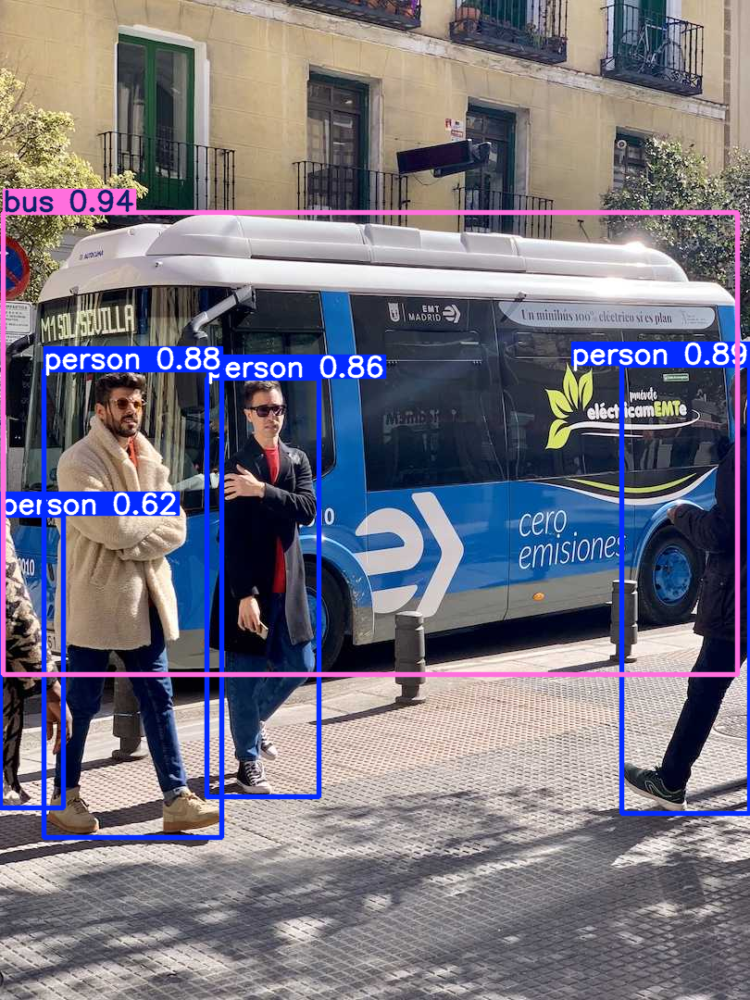

In [18]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")  # load an official model
#model = YOLO("path/to/best.pt")  # load a custom model

# Predict with the model
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image

display_results(results)

## 2. セグメンテーション


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 196.9ms
Speed: 4.0ms preprocess, 196.9ms inference, 19.8ms postprocess per image at shape (1, 3, 640, 480)


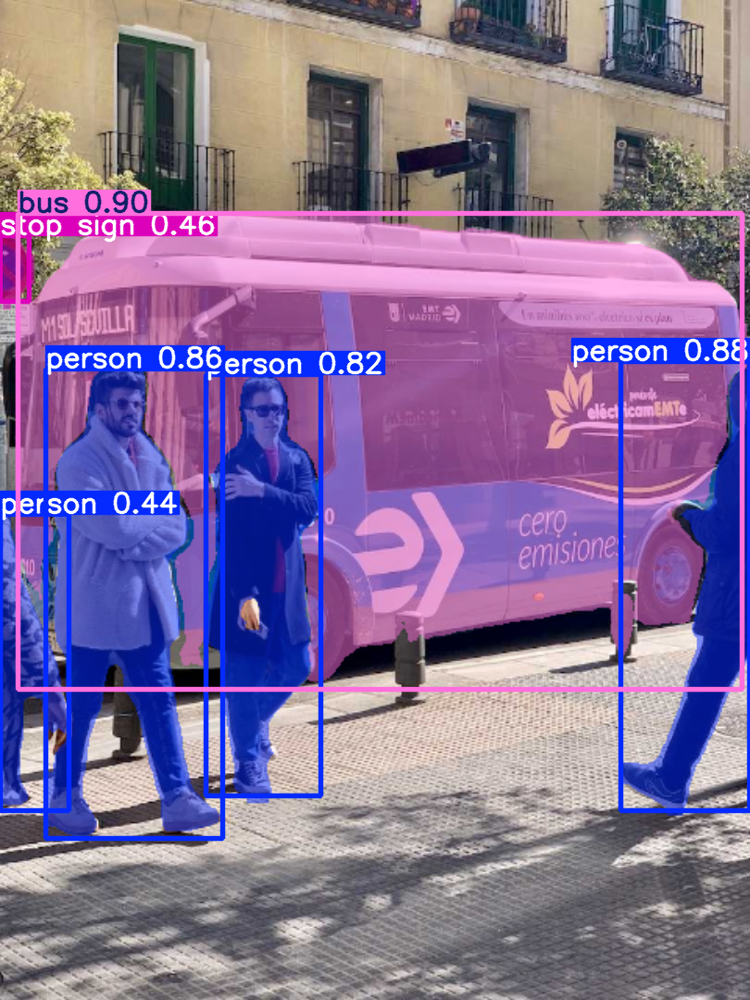

In [20]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-seg.pt")  # load an official model
#model = YOLO("path/to/best.pt")  # load a custom model

# Predict with the model
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image

display_results(results)

## 3. 姿勢


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 177.7ms
Speed: 4.9ms preprocess, 177.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


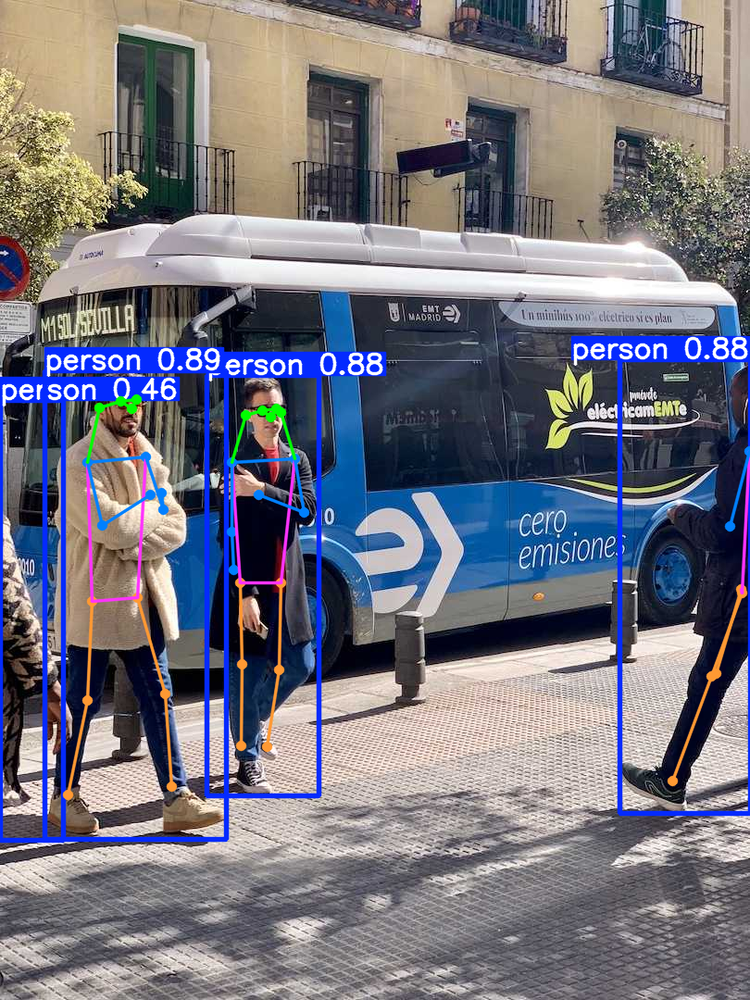

In [17]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-pose.pt")  # load an official model
#model = YOLO("path/to/best.pt")  # load a custom model

# Predict with the model
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image

display_results(results)

## 3. 分類


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 224x224 minibus 0.57, police_van 0.34, trolleybus 0.04, recreational_vehicle 0.01, streetcar 0.01, 19.5ms
Speed: 12.1ms preprocess, 19.5ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


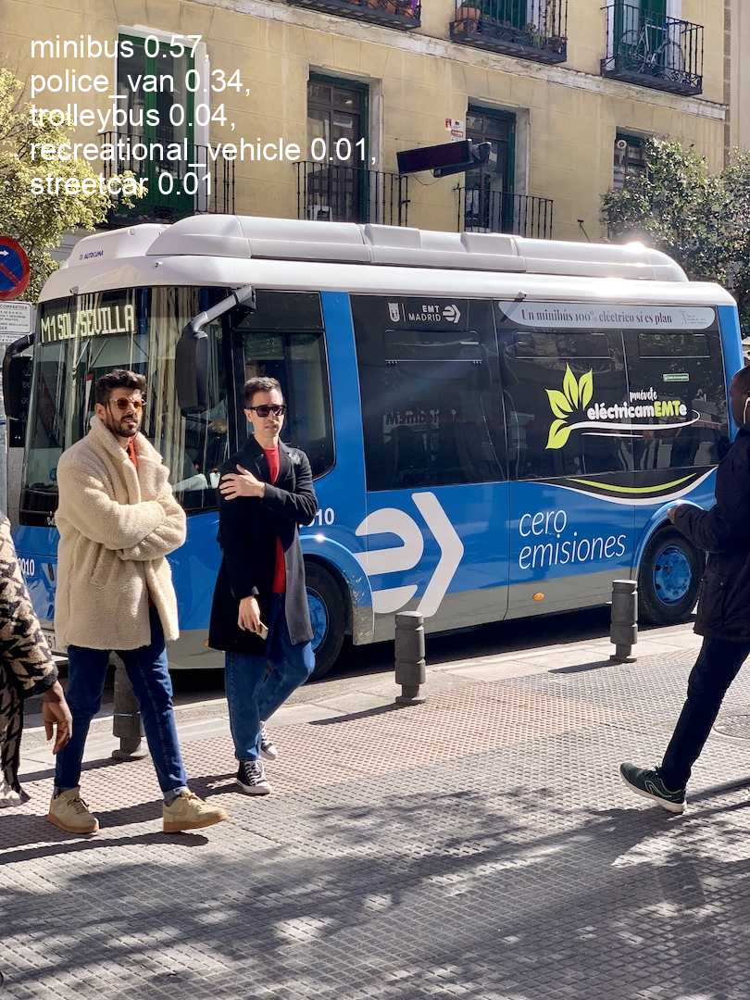

In [22]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-cls.pt")  # load an official model
#model = YOLO("path/to/best.pt")  # load a custom model

# Predict with the model
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image

display_results(results)

In [3]:
def display_results(results):
    # Process results list
    for result in results:
        boxes = result.boxes  # Boxes object for bounding box outputs
        masks = result.masks  # Masks object for segmentation masks outputs
        keypoints = result.keypoints  # Keypoints object for pose outputs
        probs = result.probs  # Probs object for classification outputs
        obb = result.obb  # Oriented boxes object for OBB outputs
        result.show()  # display to screen
        result.save(filename="result.jpg")  # save to disk

## 4. Oriented Bounding Boxes (OBB)


Found https://ultralytics.com/images/boats.jpg locally at boats.jpg
image 1/1 /content/boats.jpg: 576x1024 273.2ms
Speed: 6.9ms preprocess, 273.2ms inference, 202.6ms postprocess per image at shape (1, 3, 576, 1024)


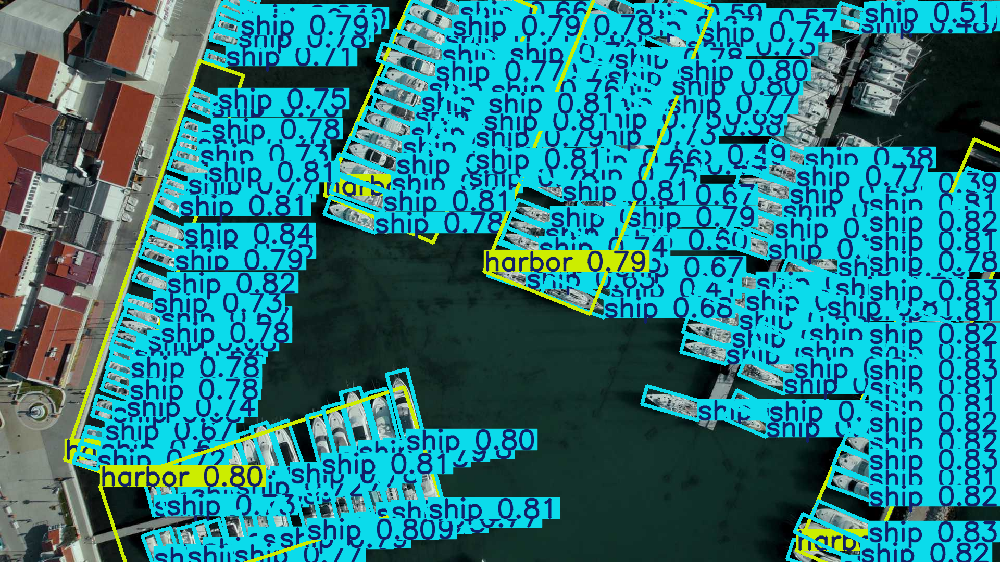

In [25]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-obb.pt")  # load an official model
#model = YOLO("path/to/best.pt")  # load a custom model

# Predict with the model
results = model("https://ultralytics.com/images/boats.jpg")  # predict on an image

display_results(results)

## 5. トラッキング

In [12]:
from ultralytics import YOLO

# Load an official or custom model
model = YOLO("yolo11n.pt")  # Load an official Detect model
#model = YOLO("yolo11n-seg.pt")  # Load an official Segment model
#model = YOLO("yolo11n-pose.pt")  # Load an official Pose model
#model = YOLO("path/to/best.pt")  # Load a custom trained model

# Perform tracking with the model
results = model.track("https://youtu.be/tShhVopoGKk?si=2APoBT-0gbxkNTPD", show=True)  # Tracking with default tracker
#results = model.track("https://youtu.be/LNwODJXcvt4", show=True, tracker="bytetrack.yaml")  # with ByteTrack

#display_results(results)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()


1/1: https://youtu.be/tShhVopoGKk?si=2APoBT-0gbxkNTPD... Success ✅ (947 frames of shape 1920x1080 at 29.97 FPS)


WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

0: 384x640 12 persons, 1 chair, 285.6ms
0: 384x640 11 persons, 1 chair, 237.8ms
0: 384x640 10 persons, 230.6ms
0: 384x640 9 persons, 279.2ms
0: 384x640 9 persons, 1 chair, 330.7ms
0: 384x640 9 persons, 1 chair, 245.2ms
0: 384x640 9 persons, 1 chair, 223.0ms
0: 384x640 

In [21]:
#!mkdir log
i = 0
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.save(filename="log/result"+str(i)+".jpg")  # save to disk
    i+=1

image_filenames = [fn for fn in "log"]
images = [imageio.v3.imread(os.path.join("log", fn)) for fn in image_filenames]
imageio.mimsave("result_movie.gif", images, duration=1.00, loop=0)
IPython.display.Image("result_movie.gif")


ValueError: need at least one array to stack

In [25]:
image_filenames = [fn for fn in "log"]
image_filenames

['l', 'o', 'g']

In [15]:
!cd log

/bin/bash: line 1: cd: log: No such file or directory


In [ ]:
def create_gif(directory, output_filename):
    # ディレクトリ内のすべてのファイル名を取得
    filenames = os.listdir(directory)

    # 画像ファイルのみをフィルタリング
    image_filenames = [fn for fn in filenames if fn.endswith('.png') or fn.endswith('.jpg')]

    # 画像を読み込む
   image_filenames = [fn for fn in filenames if fn.endswith('.png') or fn.endswith('.jpg')]
   images = [imageio.v3.imread(os.path.join(directory, fn)) for fn in image_filenames]
    print(len(images))#画像数を出力

In [26]:
from IPython.display import Image
Image('./movie_256.gif', format='png')

FileNotFoundError: No such file or directory: './movie_256.gif'

FileNotFoundError: No such file or directory: './movie_256.gif'

<IPython.core.display.Image object>